<a href="https://colab.research.google.com/github/VardanDavtyan/ML-DL/blob/main/MashtotsDataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import zipfile
from google.colab import drive

drive.mount('/content/drive/')

zip_ref = zipfile.ZipFile("/content/drive/My Drive/mashtots_dataset/mashtots-dataset.zip", 'r')
zip_ref.extractall("/tmp")
zip_ref.close()

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
!unzip "drive/My Drive/mashtots_dataset/mashtots-dataset.zip" -d "drive/My Drive/mashtots_dataset/"

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: drive/My Drive/mashtots_dataset/Train/Train/74/398.png  
  inflating: drive/My Drive/mashtots_dataset/Train/Train/74/399.png  
  inflating: drive/My Drive/mashtots_dataset/Train/Train/74/4.png  
  inflating: drive/My Drive/mashtots_dataset/Train/Train/74/40.png  
  inflating: drive/My Drive/mashtots_dataset/Train/Train/74/400.png  
  inflating: drive/My Drive/mashtots_dataset/Train/Train/74/401.png  
  inflating: drive/My Drive/mashtots_dataset/Train/Train/74/402.png  
  inflating: drive/My Drive/mashtots_dataset/Train/Train/74/403.png  
  inflating: drive/My Drive/mashtots_dataset/Train/Train/74/404.png  
  inflating: drive/My Drive/mashtots_dataset/Train/Train/74/405.png  
  inflating: drive/My Drive/mashtots_dataset/Train/Train/74/406.png  
  inflating: drive/My Drive/mashtots_dataset/Train/Train/74/407.png  
  inflating: drive/My Drive/mashtots_dataset/Train/Train/74/408.png  
  inflating: drive/My Dri

In [ ]:
import os
import cv2
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Input, Flatten, Dropout

In [ ]:
def get_directory_element_count(directory):
    try:
        elements = os.listdir(directory)
        count = len(elements)
        return count, elements
    except FileNotFoundError:
        return -1, []  # Return -1 if the directory is not found
    except PermissionError:
        return -2, []  # Return -2 if there's a permission error
    except Exception as e:
        return -3, []  # Return -3 for other types of errors

In [ ]:
for i in range(78):
  print(get_directory_element_count(f'drive/My Drive/mashtots_dataset/Train/Train/{i}')[0])

854
870
924
831
896
776
815
864
909
885
886
904
900
927
785
931
880
879
917
932
839
899
927
829
873
865
930
852
918
926
868
933
913
880
916
891
886
931
865
940
924
929
929
917
909
925
925
922
935
928
932
920
915
910
928
887
907
909
928
921
879
932
911
908
869
920
881
880
924
891
925
919
924
916
864
851
926
894


In [ ]:
label_indexes = []
data = []
class_count = 78

for current_label_index in range(class_count):
  current_path = f'drive/My Drive/mashtots_dataset/Train/Train/{current_label_index}'
  count = get_directory_element_count(current_path)[0]
  for i in range(count):
    img = cv2.imread(f'{current_path}/{i+1}.png')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    data.append(img)
    label_indexes.append(current_label_index)


##Preprocessing Data for train

In [ ]:
data = np.array(data)
data = data / 255
data = data.reshape(data.shape[0], 64, 64, 1)

In [ ]:
label_indexes = np.array(label_indexes)
label_indexes = to_categorical(label_indexes, class_count)

In [ ]:
X, y = shuffle(data, label_indexes, random_state=42)

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

##Training

In [ ]:
model = keras.Sequential([
    Conv2D(32, (3,3), padding='same', activation='relu', input_shape=(64, 64, 1)),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), padding='same', activation='relu'),
    MaxPooling2D((2, 2), strides=2),
    Flatten(),
    Dense(200, activation='relu'),
    Dense(class_count,  activation='sigmoid')
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 16, 16, 64)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 16384)             0         
                                                                 
 dense (Dense)               (None, 200)               3

In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(x_train, y_train, batch_size=32, epochs=25, validation_split=0.2)

Epoch 1/25
1402/1402 [==============================] - 320s 227ms/step - loss: 1.6669 - accuracy: 0.5655 - val_loss: 0.9189 - val_accuracy: 0.7438
Epoch 2/25
1402/1402 [==============================] - 311s 222ms/step - loss: 0.6409 - accuracy: 0.8136 - val_loss: 0.6953 - val_accuracy: 0.8068
Epoch 3/25
1402/1402 [==============================] - 313s 223ms/step - loss: 0.3734 - accuracy: 0.8856 - val_loss: 0.6297 - val_accuracy: 0.8263
Epoch 4/25
1402/1402 [==============================] - 310s 221ms/step - loss: 0.2407 - accuracy: 0.9232 - val_loss: 0.6859 - val_accuracy: 0.8273
Epoch 5/25
1402/1402 [==============================] - 313s 223ms/step - loss: 0.1640 - accuracy: 0.9457 - val_loss: 0.7497 - val_accuracy: 0.8259
Epoch 6/25
1402/1402 [==============================] - 307s 219ms/step - loss: 0.1186 - accuracy: 0.9605 - val_loss: 0.7382 - val_accuracy: 0.8360
Epoch 7/25
1402/1402 [==============================] - 300s 214ms/step - loss: 0.0925 - accuracy: 0.9687 - val_

In [ ]:
model.evaluate(x_test, y_test)

438/438 [==============================] - 21s 48ms/step - loss: 1.2675 - accuracy: 0.8395


[1.2675317525863647, 0.8394947052001953]

In [ ]:
model.save('mashtots_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


##Testing

In [ ]:
mapping_dict = {
    0: 'Ա',   1: 'Բ',   2: 'Գ',   3: 'Դ',   4: 'Ե',   5: 'Զ',
    6: 'Է',   7: 'Ը',   8: 'Թ',   9: 'Ժ',   10: 'Ի',  11: 'Լ',
    12: 'Խ',  13: 'Ծ',  14: 'Կ',  15: 'Հ',  16: 'Ձ',  17: 'Ղ',
    18: 'Ճ',  19: 'Մ',  20: 'Յ',  21: 'Ն',  22: 'Շ',  23: 'Ո',
    24: 'Ու', 25: 'Չ',  26: 'Պ',  27: 'Ջ',  28: 'Ռ',  29: 'Ս',
    30: 'Վ',  31: 'Տ',  32: 'Ր',  33: 'Ց',  34: 'Փ',  35: 'Ք',
    36: 'Եվ', 37: 'Օ',  38: 'Ֆ',  39: 'ա',  40: 'բ',  41: 'գ',
    42: 'դ',  43: 'ե',  44: 'զ',  45: 'է',  46: 'ը',  47: 'թ',
    48: 'ժ',  49: 'ի',  50: 'լ',  51: 'խ',  52: 'ծ',  53: 'կ',
    54: 'հ',  55: 'ձ',  56: 'ղ',  57: 'ճ',  58: 'մ',  59: 'յ',
    60: 'ն',  61: 'շ',  62: 'ո',  63: 'ու', 64: 'չ',  65: 'պ',
    66: 'ջ',  67: 'ռ',  68: 'ս',  69: 'վ',  70: 'տ',  71: 'ր',
    72: 'ց',  73: 'փ',  74: 'ք',  75: 'և',  76: 'օ',  77: 'ֆ'
}

Տ


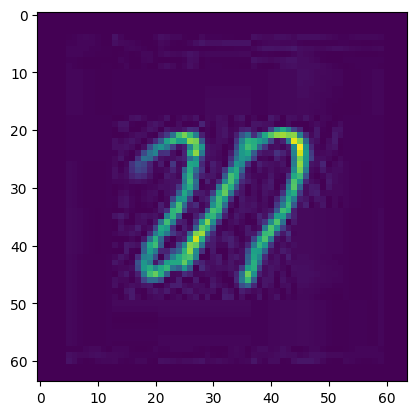

In [ ]:
index = 7249
plt.imshow(x_test[index])
print(mapping_dict[np.argmax(y_test[index])])

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('mashtots_model.h5')

In [ ]:
pred = model.predict(np.expand_dims(x_test[index], axis=0))

1/1 [==============================] - 0s 164ms/step


In [ ]:
print(mapping_dict[np.argmax(pred)])

Ու


In [ ]:
import pandas as pd

chunk_size = 1000

result_df = pd.DataFrame()
chunked = pd.read_csv('drive/My Drive/mashtots_dataset/new_test/new_test.csv', chunksize=chunk_size)
for chunk in chunked:
    result_df = pd.concat([result_df, chunk], ignore_index=True)

In [ ]:
test_data = []

for i in range(result_df.shape[0]):
  test_data.append(np.array(result_df.loc[i]).reshape((64, 64)))

test_data = np.array(test_data)
test_data = test_data / 255
test_data = test_data.reshape(test_data.shape[0], 64, 64, 1)

In [ ]:
predictions = pd.DataFrame(columns=['Id', 'Category'])

batch_size = 100

for i in range(0, test_data.shape[0], batch_size):
    batch_data = test_data[i:i + batch_size]
    batch_preds = model.predict(batch_data)

    batch_categories = np.argmax(batch_preds, axis=1)

    for j in range(len(batch_categories)):
        current_id = i + j + 1
        predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)

predictions.to_csv('sample_submission.csv', index=False)

4/4 [==============================] - 0s 33ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 31ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 33ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 52ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 52ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 39ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 33ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 34ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 36ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 33ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 46ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 52ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 40ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 42ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 36ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 36ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 41ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 36ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 35ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 34ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 35ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 36ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 35ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 52ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)


4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 71ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 68ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 64ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 40ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 44ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 40ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 45ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 43ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 41ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 42ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

2/4 [==============>...............] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 46ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 44ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 41ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 44ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 44ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 44ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 45ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 43ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 45ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 45ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 50ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 74ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 69ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 64ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 47ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 52ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 46ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 44ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 47ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 47ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 47ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 47ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 46ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 48ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 49ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 52ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 47ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 48ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 47ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 48ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 64ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 68ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)


4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 49ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 50ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 48ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 50ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 64ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 67ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 67ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 50ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

2/4 [==============>...............] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)


4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 73ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 68ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 73ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 69ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 64ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)


4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)


4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)


4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 64ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)


4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 52ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 70ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 47ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 63ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 67ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 73ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)


4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 44ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 73ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 65ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 68ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 67ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 67ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 63ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 69ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 63ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 67ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 52ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 69ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)


4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 63ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 63ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 64ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 50ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 50ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 50ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 64ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 70ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 65ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 63ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 63ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 64ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 66ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 63ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 67ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 65ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 67ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 71ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 69ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 63ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 67ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 64ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 63ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 63ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 66ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 74ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 50ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 52ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 51ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 53ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

1/4 [======>.......................] - ETA: 0s

<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)


4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 66ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 1s 116ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 61ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 54ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 63ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 60ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 56ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 59ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 62ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 55ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 73ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 57ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 79ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 69ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 58ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p

4/4 [==============================] - 0s 63ms/step


<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions = predictions.append({'Id': current_id, 'Category': batch_categories[j]}, ignore_index=True)
<ipython-input-23-55aa06dbc459>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  p